In [ ]:
# Check if GPU is available and set random seeds for reproducibility
import torch
import numpy as np
import random
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

# Set seeds
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

# Check GPU
print(f"CUDA Available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU Name: {torch.cuda.get_device_name(0)}")
    print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")
    torch.cuda.empty_cache()



CUDA Available: True
GPU Name: Tesla T4
GPU Memory: 15.64 GB


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!ls /content/drive/MyDrive/dataset-NCKH-SignDETR-VSL/

dataset.zip  final_dataset_vsl.zip


In [ ]:
!cp /content/drive/MyDrive/dataset-NCKH-SignDETR-VSL/final_dataset_vsl.zip /content/
!unzip -q /content/dataset.zip -d /content/SignDETR-VSL

In [ ]:
import os

ROOT = "/content/SignDETR-VSL"
splits = ["train", "valid", "test"]

def count_files(path, exts):
    return len([f for f in os.listdir(path) if f.lower().endswith(exts)])

for split in splits:
    img_dir = f"{ROOT}/{split}/images"
    lbl_dir = f"{ROOT}/{split}/labels"

    n_imgs = count_files(img_dir, (".jpg", ".png", ".jpeg"))
    n_lbls = count_files(lbl_dir, (".txt",))

    print(f"{split.upper():5} | images: {n_imgs:5} | labels: {n_lbls:5}")


TRAIN | images:  2260 | labels:  2260
VALID | images:   584 | labels:   584
TEST  | images:   552 | labels:   552


In [ ]:
def filename_set(path, ext):
    return set(os.path.splitext(f)[0] for f in os.listdir(path) if f.endswith(ext))

for split in splits:
    img_dir = f"{ROOT}/{split}/images"
    lbl_dir = f"{ROOT}/{split}/labels"

    imgs = filename_set(img_dir, ".jpg") | filename_set(img_dir, ".png")
    lbls = filename_set(lbl_dir, ".txt")

    missing_lbl = imgs - lbls
    missing_img = lbls - imgs

    print(f"\n[{split.upper()}]")
    print("Missing labels:", len(missing_lbl))
    print("Missing images:", len(missing_img))



[TRAIN]
Missing labels: 0
Missing images: 0

[VALID]
Missing labels: 0
Missing images: 0

[TEST]
Missing labels: 0
Missing images: 0


In [ ]:
!find /content/SignDETR-VSL -maxdepth 2 -type d


/content/SignDETR-VSL
/content/SignDETR-VSL/train
/content/SignDETR-VSL/train/images
/content/SignDETR-VSL/train/labels
/content/SignDETR-VSL/valid
/content/SignDETR-VSL/valid/images
/content/SignDETR-VSL/valid/labels
/content/SignDETR-VSL/test
/content/SignDETR-VSL/test/images
/content/SignDETR-VSL/test/labels


In [ ]:
def filename_set(path, ext):
    return set(os.path.splitext(f)[0] for f in os.listdir(path) if f.endswith(ext))

for split in splits:
    img_dir = f"{ROOT}/{split}/images"
    lbl_dir = f"{ROOT}/{split}/labels"

    imgs = filename_set(img_dir, ".jpg") | filename_set(img_dir, ".png")
    lbls = filename_set(lbl_dir, ".txt")

    missing_lbl = imgs - lbls
    missing_img = lbls - imgs

    print(f"\n[{split.upper()}]")
    print("Missing labels:", len(missing_lbl))
    print("Missing images:", len(missing_img))



[TRAIN]
Missing labels: 0
Missing images: 0

[VALID]
Missing labels: 0
Missing images: 0

[TEST]
Missing labels: 0
Missing images: 0


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

LABEL_ID = 5  # đổi nhãn bạn muốn xem

IMG_DIR = "/content/SignDETR-VSL/train/images"
LBL_DIR = "/content/SignDETR-VSL/train/labels"

images_with_label = []

for lbl_file in os.listdir(LBL_DIR):
    lbl_path = os.path.join(LBL_DIR, lbl_file)
    with open(lbl_path, "r") as f:
        for line in f:
            if int(line.split()[0]) == LABEL_ID:
                img_name = lbl_file.replace(".txt", ".jpg")  # hoặc .png
                images_with_label.append(img_name)
                break

print(f"Tìm thấy {len(images_with_label)} ảnh có nhãn {LABEL_ID}")

Tìm thấy 99 ảnh có nhãn 5


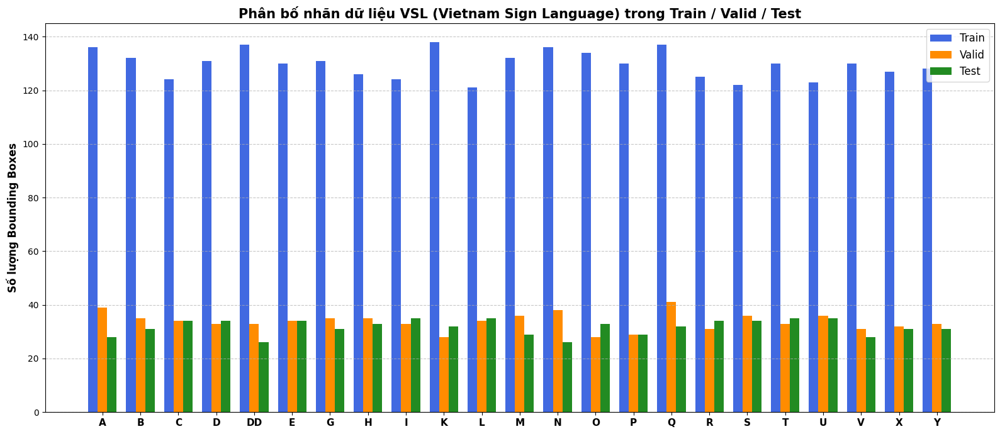


 Dataset sạch sẽ, không có ID nhãn nào vượt quá giới hạn 0-22.


In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np

DATA_DIR = "/content/SignDETR-VSL/"
splits = ['train', 'valid', 'test']
CLASSES = ['A', 'B', 'C', 'D', 'E', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'X', 'Y']
# Khởi tạo dictionary để đếm số lượng bbox
counts = {split: {i: 0 for i in range(len(CLASSES))} for split in splits}
invalid_labels = []

# Quét file labels
for split in splits:
    lbl_dir = os.path.join(DATA_DIR, split, 'labels')
    if not os.path.exists(lbl_dir):
        continue

    for file in os.listdir(lbl_dir):
        if file.endswith('.txt'):
            with open(os.path.join(lbl_dir, file), 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) > 0:
                        cls_id = int(parts[0])
                        # Nếu ID nằm trong danh sách chuẩn
                        if 0 <= cls_id < len(CLASSES):
                            counts[split][cls_id] += 1
                        else:
                            invalid_labels.append((split, file, cls_id))

# Vẽ biểu đồ
x = np.arange(len(CLASSES))
width = 0.25  # Độ rộng của mỗi cột

fig, ax = plt.subplots(figsize=(16, 7))

train_counts = [counts['train'][i] for i in range(len(CLASSES))]
valid_counts = [counts['valid'][i] for i in range(len(CLASSES))]
test_counts = [counts['test'][i] for i in range(len(CLASSES))]

# Tạo các cột
rects1 = ax.bar(x - width, train_counts, width, label='Train', color='royalblue')
rects2 = ax.bar(x, valid_counts, width, label='Valid', color='darkorange')
rects3 = ax.bar(x + width, test_counts, width, label='Test', color='forestgreen')

# Trang trí biểu đồ
ax.set_ylabel('Số lượng Bounding Boxes', fontsize=12, fontweight='bold')
ax.set_title('Phân bố nhãn dữ liệu VSL (Vietnam Sign Language) trong Train / Valid / Test', fontsize=15, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(CLASSES, fontsize=11, fontweight='bold')
ax.legend(fontsize=12)
ax.grid(axis='y', linestyle='--', alpha=0.7)

plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# In cảnh báo nếu có nhãn rác
if invalid_labels:
    print("\n⚠️ CẢNH BÁO: Phát hiện các nhãn rác (ID >= 23 hoặc < 0) trong Dataset!")
    print(f"Tổng số nhãn rác: {len(invalid_labels)}")
    print("5 ví dụ đầu tiên:", invalid_labels[:5])
else:
    print("\n Dataset sạch sẽ, không có ID nhãn nào vượt quá giới hạn 0-22.")

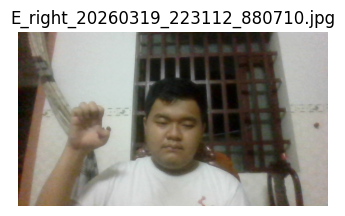

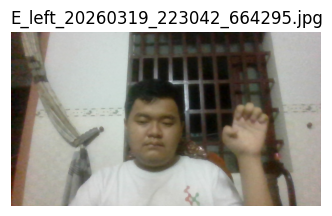

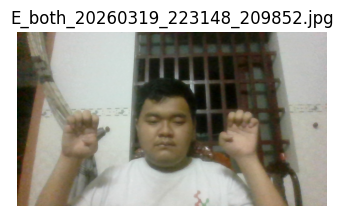

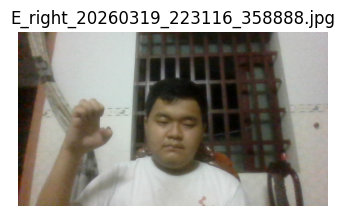

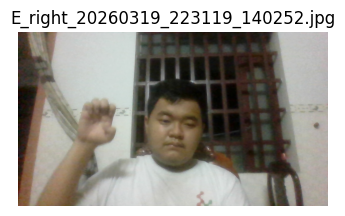

...

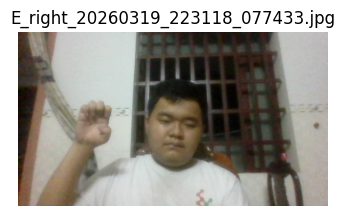

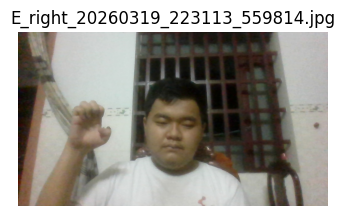

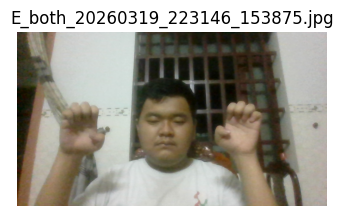

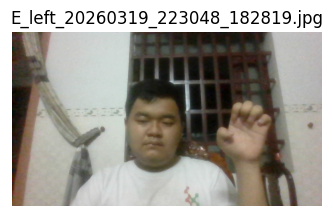

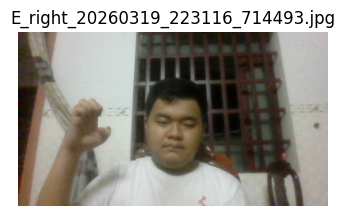

In [ ]:
for img_name in images_with_label:
    img_path = os.path.join(IMG_DIR, img_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(4,4))
    plt.imshow(img)
    plt.axis("off")
    plt.title(img_name)
    plt.show()

In [ ]:
def draw_yolo_bbox(img, label_path):
    h, w, _ = img.shape
    with open(label_path, "r") as f:
        for line in f:
            cls, xc, yc, bw, bh = map(float, line.split())
            x1 = int((xc - bw/2) * w)
            y1 = int((yc - bh/2) * h)
            x2 = int((xc + bw/2) * w)
            y2 = int((yc + bh/2) * h)
            cv2.rectangle(img, (x1,y1), (x2,y2), (255,0,0), 2)
    return img

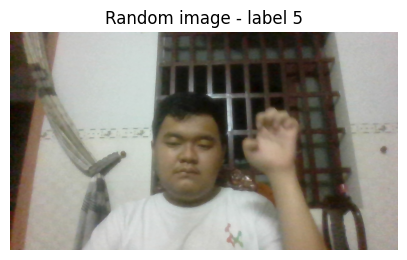

In [ ]:
import random

random_img = random.choice(images_with_label)

img_path = os.path.join(IMG_DIR, random_img)
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(5,5))
plt.imshow(img)
plt.axis("off")
plt.title(f"Random image - label {LABEL_ID}")
plt.show()

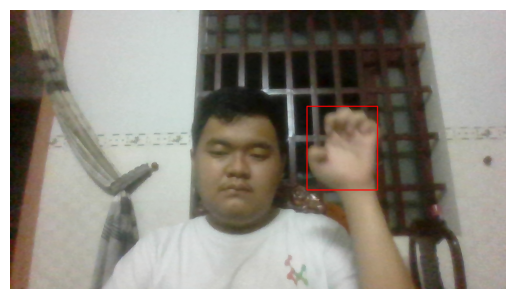

In [ ]:
lbl_path = os.path.join(LBL_DIR, random_img.replace(".jpg", ".txt"))
img_box = draw_yolo_bbox(img.copy(), lbl_path)

plt.imshow(img_box)
plt.axis("off")
plt.show()

In [ ]:
names = ['A', 'B', 'C', 'D', 'E', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'X', 'Y']

id2name = {i: name for i, name in enumerate(names)}
name2id = {name: i for i, name in enumerate(names)}

print(id2name)

{0: 'A', 1: 'B', 2: 'C', 3: 'D', 4: 'DD', 5: 'E', 6: 'G', 7: 'H', 8: 'I', 9: 'K', 10: 'L', 11: 'M', 12: 'N', 13: 'O', 14: 'P', 15: 'Q', 16: 'R', 17: 'S', 18: 'T', 19: 'U', 20: 'V', 21: 'X', 22: 'Y'}


In [ ]:
import subprocess
import sys

packages = [
    'albumentations',
    'colorama',
    'rich',
    'torchinfo',
    'scipy'
]

print("Installing required packages...")
for package in packages:
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q', package])

print("All packages installed successfully!")

# Verify PyTorch installation
print(f"\nPyTorch version: {torch.__version__}")
print(f"TorchVision version: {__import__('torchvision').__version__}")

Installing required packages...
All packages installed successfully!

PyTorch version: 2.10.0+cu128
TorchVision version: 0.25.0+cu128


## mô hình DETR

In [ ]:
# Define DETR Model
import torch
from torch import nn
from torchvision.models import resnet50, ResNet50_Weights
#
import math

def _get_1d_sincos_pos_embed(length: int, dim: int, temperature: float = 10000.0, device=None):
    assert dim % 2 == 0
    position = torch.arange(length, device=device, dtype=torch.float32).unsqueeze(1)
    div_term = torch.exp(
        torch.arange(0, dim, 2, device=device, dtype=torch.float32) * (-math.log(temperature) / dim)
    )
    pe = torch.zeros(length, dim, device=device, dtype=torch.float32)
    pe[:, 0::2] = torch.sin(position * div_term)
    pe[:, 1::2] = torch.cos(position * div_term)
    return pe

def build_2d_sincos_position_embedding(height: int, width: int, dim: int, device=None):
    assert dim % 2 == 0, "positional dim must be even"
    dim_half = dim // 2
    pe_y = _get_1d_sincos_pos_embed(height, dim_half, device=device)
    pe_x = _get_1d_sincos_pos_embed(width, dim_half, device=device)
    pos = torch.zeros(height, width, dim, device=device, dtype=torch.float32)
    pos[:, :, :dim_half] = pe_y[:, None, :].expand(-1, width, -1)
    pos[:, :, dim_half:] = pe_x[None, :, :].expand(height, -1, -1)
    pos = pos.view(1, height * width, dim)
    return pos

class DETR(nn.Module):
    def __init__(self, num_classes, hidden_dim=256, nheads=8,
                 num_encoder_layers=1, num_decoder_layers=1, num_queries=25):
        super().__init__()

        # ResNet-50 backbone
        self.backbone = resnet50(weights=ResNet50_Weights.IMAGENET1K_V1)
        self.backbone.fc = nn.Identity()

        # Conversion layer
        self.conv = nn.Conv2d(2048, hidden_dim, 1)

        # Transformer
        self.transformer = nn.Transformer(
            hidden_dim, nheads, num_encoder_layers, num_decoder_layers,
            batch_first=True, dropout=0.1)

        # Prediction heads
        self.linear_class = nn.Linear(hidden_dim, num_classes + 1)
        self.linear_bbox = nn.Linear(hidden_dim, 4)

        # Query embeddings
        self.num_queries = num_queries
        self.query_pos = nn.Parameter(torch.randn(self.num_queries, hidden_dim))

        # Normalizations
        self.norm_src = nn.LayerNorm(hidden_dim)
        self.norm_tgt = nn.LayerNorm(hidden_dim)

    def forward(self, inputs):
        x = self.backbone.conv1(inputs)
        x = self.backbone.bn1(x)
        x = self.backbone.relu(x)
        x = self.backbone.maxpool(x)

        x = self.backbone.layer1(x)
        x = self.backbone.layer2(x)
        x = self.backbone.layer3(x)
        x = self.backbone.layer4(x)

        feat = self.conv(x)
        bsz, d_model, Hf, Wf = feat.shape
        src = feat.flatten(2).permute(0, 2, 1)

        pos = build_2d_sincos_position_embedding(Hf, Wf, d_model, device=feat.device)
        src = self.norm_src(src + pos)

        tgt = torch.zeros(bsz, self.num_queries, d_model, device=feat.device)
        query_pos = self.query_pos.unsqueeze(0).expand(bsz, -1, -1)
        tgt = self.norm_tgt(tgt + query_pos)

        hs = self.transformer(src=src, tgt=tgt)

        return {
            'pred_logits': self.linear_class(hs),
            'pred_boxes': self.linear_bbox(hs).sigmoid()
        }

print("DETR model defined")

DETR model defined


In [ ]:
CLASSES = ['A', 'B', 'C', 'D', 'E', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'X', 'Y']

In [ ]:
# Define utility functions for boxes and data
from scipy.optimize import linear_sum_assignment
import torch.nn.functional as F

def box_cxcywh_to_xyxy(x):
    """Convert boxes from (cx, cy, w, h) to (x1, y1, x2, y2)"""
    x0, y0, w, h = x.unbind(-1)
    b = [(x0 - 0.5 * w), (y0 - 0.5 * h), (x0 + 0.5 * w), (y0 + 0.5 * h)]
    return torch.stack(b, dim=-1)

def generalized_box_iou(boxes1, boxes2):
    """Compute the IoU between boxes"""
    assert (boxes1[:, 2:] >= boxes1[:, :2]).all()
    assert (boxes2[:, 2:] >= boxes2[:, :2]).all()

    iou, union = box_iou(boxes1, boxes2)

    lt = torch.min(boxes1[:, None, :2], boxes2[:, :2])
    rb = torch.max(boxes1[:, None, 2:], boxes2[:, 2:])
    wh = (rb - lt).clamp(min=0)
    enc_area = wh[:, :, 0] * wh[:, :, 1]

    return iou - (enc_area - union) / enc_area

def box_iou(boxes1, boxes2):
    area1 = (boxes1[:, 2] - boxes1[:, 0]) * (boxes1[:, 3] - boxes1[:, 1])
    area2 = (boxes2[:, 2] - boxes2[:, 0]) * (boxes2[:, 3] - boxes2[:, 1])

    lt = torch.max(boxes1[:, None, :2], boxes2[:, :2])
    rb = torch.min(boxes1[:, None, 2:], boxes2[:, 2:])
    wh = (rb - lt).clamp(min=0)
    inter = wh[:, :, 0] * wh[:, :, 1]

    union = area1[:, None] + area2 - inter
    iou = inter / union
    return iou, union

def rescale_bboxes(out_bbox, size):
    """Rescale bounding boxes from normalized coordinates"""
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=b.dtype, device=b.device)
    return b

def stacker(batch):
    """Stack batch items"""
    images, targets = [], []
    for img, tgt in batch:
        images.append(img)
        targets.append(tgt)
    return torch.stack(images), targets

def get_classes():
    return CLASSES

def get_colors():
    return [(0, 255, 0), (255, 0, 0), (0, 0, 255)]

print("Utility functions defined")

Utility functions defined


In [ ]:
# Define Loss Functions
class HungarianMatcher(nn.Module):
    """Hungarian matching for DETR"""
    def __init__(self, weight_dict: dict):
        super().__init__()
        self.class_weighting = weight_dict.get('class_weighting')
        self.bbox_weighting = weight_dict.get('bbox_weighting')
        self.giou_weighting = weight_dict.get('giou_weighting')

    @torch.no_grad()
    def forward(self, yhat, y):
        indices = []
        for batch_idx, target in enumerate(y):
            batch_logits = yhat["pred_logits"][batch_idx]
            batch_boxes = yhat["pred_boxes"][batch_idx]
            batch_prob = batch_logits.softmax(-1)

            tgt_labels = target["labels"].to(torch.long)
            tgt_boxes = target["boxes"].to(batch_boxes.dtype)

            cost_class = -batch_prob[:, tgt_labels]
            cost_bbox = torch.cdist(batch_boxes, tgt_boxes, p=1)
            cost_giou = -generalized_box_iou(
                box_cxcywh_to_xyxy(batch_boxes),
                box_cxcywh_to_xyxy(tgt_boxes)
            )

            C_batch = (self.bbox_weighting * cost_bbox +
                      self.class_weighting * cost_class +
                      self.giou_weighting * cost_giou).cpu()

            ii, jj = linear_sum_assignment(C_batch)
            indices.append(
                (torch.as_tensor(ii, dtype=torch.int64), torch.as_tensor(jj, dtype=torch.int64))
            )
        return indices

class DETRLoss(nn.Module):
    """DETR Loss computation"""
    def __init__(self, num_classes, matcher, weight_dict, eos_coef):
        super().__init__()
        self.num_classes = num_classes
        self.matcher = matcher
        self.weight_dict = weight_dict
        self.eos_coef = eos_coef
        empty_weight = torch.ones(self.num_classes + 1)
        empty_weight[-1] = self.eos_coef
        self.register_buffer('empty_weight', empty_weight)

    def classification_loss(self, yhat, y, indices):
        src_logits = yhat['pred_logits']
        idx = self.get_matched_query_indices(indices)
        target_classes_o = torch.cat([t["labels"][J] for t, (_, J) in zip(y, indices)])
        target_classes = torch.full(src_logits.shape[:2], self.num_classes,
                                  dtype=torch.int64, device=src_logits.device)
        target_classes[idx] = target_classes_o
        loss_ce = F.cross_entropy(src_logits.transpose(1, 2), target_classes, self.empty_weight)
        return {'loss_ce': loss_ce}

    def box_loss(self, yhat, y, indices, num_boxes):
        idx = self.get_matched_query_indices(indices)
        src_boxes = yhat['pred_boxes'][idx]
        target_boxes = torch.cat([t['boxes'][i] for t, (_, i) in zip(y, indices)], dim=0)

        loss_bbox = F.l1_loss(src_boxes, target_boxes, reduction='none')
        loss_bbox_sum = loss_bbox.sum() / num_boxes

        loss_giou = 1 - torch.diag(generalized_box_iou(
            box_cxcywh_to_xyxy(src_boxes),
            box_cxcywh_to_xyxy(target_boxes)))
        loss_giou_sum = loss_giou.sum() / num_boxes

        return {'loss_bbox': loss_bbox_sum, 'loss_giou': loss_giou_sum}

    def get_matched_query_indices(self, indices):
        batch_idx = torch.cat([torch.full_like(src, i) for i, (src, _) in enumerate(indices)])
        src_idx = torch.cat([src for (src, _) in indices])
        return batch_idx, src_idx

    def forward(self, yhat, y):
        indices = self.matcher(yhat, y)
        device = next(iter(yhat.values())).device
        y = [{'labels': t['labels'].to(torch.long), 'boxes': t['boxes'].to(torch.float32)} for t in y]

        num_boxes = sum(len(t["labels"]) for t in y)
        num_boxes = torch.as_tensor([num_boxes], dtype=torch.float, device=device).clamp(min=1)

        return {
            'labels': self.classification_loss(yhat, y, indices),
            'boxes': self.box_loss(yhat, y, indices, num_boxes)
        }

print("Loss functions defined")

Loss functions defined


In [ ]:
import os
import glob
import torch
import numpy as np
from torch.utils.data import Dataset
from PIL import Image
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2

class DETRData(Dataset):
    def __init__(self, path, train=True):
        super().__init__()
        self.path = path
        self.labels_path = os.path.join(self.path, 'labels')
        self.images_path = os.path.join(self.path, 'images')

        if os.path.exists(self.labels_path):
            self.label_files = os.listdir(self.labels_path)
            self.labels = list(filter(lambda x: x.endswith('.txt'), self.label_files))
        else:
            self.labels = []
            print(f"Cảnh báo: Không tìm thấy thư mục labels tại {self.labels_path}")

        self.train = train

    def safe_transform(self, image, bboxes, labels, max_attempts=50):
        TARGET_SIZE = 512

        self.transform = A.Compose(
            [
                A.LongestMaxSize(max_size=800),
                A.PadIfNeeded(min_height=800, min_width=800, border_mode=cv2.BORDER_CONSTANT, fill=(0,0,0)),
                *([
                    A.RandomSizedBBoxSafeCrop(width=TARGET_SIZE, height=TARGET_SIZE, erosion_rate=0.0, p=0.7),
                    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=15, p=0.4),
                    A.MotionBlur(blur_limit=3, p=0.2),
                    A.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1, p=0.5),
                ] if self.train else []),
                A.Resize(TARGET_SIZE, TARGET_SIZE),
                A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
                ToTensorV2()
            ],
            # Dùng YOLO format: [x_center, y_center, width, height]
            bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'], min_visibility=0.3)
        )

        for attempt in range(max_attempts):
            try:
                transformed = self.transform(image=image, bboxes=bboxes, class_labels=labels)
                if len(transformed['bboxes']) > 0:
                    return transformed
            except Exception:
                continue

        # Fallback an toàn
        fallback = A.Compose([
            A.LongestMaxSize(max_size=TARGET_SIZE),
            A.PadIfNeeded(min_height=TARGET_SIZE, min_width=TARGET_SIZE, border_mode=cv2.BORDER_CONSTANT, fill=(0,0,0)),
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            ToTensorV2()
        ], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

        return fallback(image=image, bboxes=bboxes, class_labels=labels)

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        label_filename = self.labels[idx]
        label_path = os.path.join(self.labels_path, label_filename)

        image_name_base = os.path.splitext(label_filename)[0]
        search_pattern = os.path.join(self.images_path, image_name_base + "*")
        found_images = glob.glob(search_pattern)

        if len(found_images) == 0:
            return self.__getitem__((idx + 1) % len(self))

        image_path = found_images[0]

        try:
            img = Image.open(image_path).convert('RGB')

            with open(label_path, 'r') as f:
                annotations = f.readlines()

            class_labels = []
            bounding_boxes = []

            for annotation in annotations:
                parts = annotation.strip().split()
                if len(parts) < 5: continue

                cls_id = int(parts[0])
                # Đọc trực tiếp 4 giá trị YOLO [x_center, y_center, width, height]
                x_c, y_c, w, h = [float(x) for x in parts[1:5]]

                # Ép giá trị nằm chuẩn trong khoảng [0.0, 1.0] để tránh lỗi Albumentations
                x_c = np.clip(x_c, 0.0, 1.0)
                y_c = np.clip(y_c, 0.0, 1.0)
                w = np.clip(w, 0.0, 1.0)
                h = np.clip(h, 0.0, 1.0)

                # Chỉ nhận các box hợp lệ
                if w > 0.001 and h > 0.001:
                    class_labels.append(cls_id)
                    bounding_boxes.append([x_c, y_c, w, h])

            if len(class_labels) == 0:
                return self.__getitem__((idx + 1) % len(self))

            class_labels = np.array(class_labels)
            bounding_boxes = np.array(bounding_boxes)

            # Augmentation
            augmented = self.safe_transform(image=np.array(img), bboxes=bounding_boxes, labels=class_labels)

            augmented_img_tensor = augmented['image']
            augmented_bounding_boxes = np.array(augmented['bboxes'])
            augmented_classes = augmented['class_labels']

            if len(augmented_bounding_boxes) == 0:
                 return self.__getitem__((idx + 1) % len(self))

            labels = torch.tensor(augmented_classes, dtype=torch.long)
            # Boxes xuất ra từ Dataset đang ở định dạng YOLO: [cx, cy, w, h]
            boxes = torch.tensor(augmented_bounding_boxes, dtype=torch.float32)

            return augmented_img_tensor, {'labels': labels, 'boxes': boxes}

        except Exception as e:
            print(f"Bỏ qua file lỗi {label_filename}: {str(e)}")
            return self.__getitem__((idx + 1) % len(self))

## load dataset

In [ ]:
DATA_DIR = "/content/SignDETR-VSL/"


In [ ]:
# Initialize training components
from torch import optim
from torch.utils.data import DataLoader
# Device setup
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Training configuration
num_classes = 22
batch_size = 4
learning_rate = 1e-5
num_epochs = 100


# Create datasets and dataloaders
print("Loading datasets...")
train_dataset = DETRData(os.path.join(DATA_DIR, 'train'), train=True)
valid_dataset = DETRData(os.path.join(DATA_DIR, 'valid'), train=False)
test_dataset = DETRData(os.path.join(DATA_DIR, 'test'), train=False)

# train_dataloader = DataLoader(train_dataset, batch_size=batch_size, collate_fn=stacker, drop_last=True)
# valid_dataloader = DataLoader(valid_dataset, batch_size=batch_size, collate_fn=stacker, drop_last=True)
# Dành cho tập train
train_dataloader = DataLoader(
    train_dataset,
    batch_size=8,
    shuffle=True,
    num_workers=2,
    pin_memory=True,
    collate_fn=stacker
)

# Dành cho tập validation
valid_dataloader = DataLoader(
    valid_dataset,
    batch_size=8,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
    collate_fn=stacker
)


test_dataloader = DataLoader(test_dataset, batch_size=batch_size, collate_fn=stacker, drop_last=True)

print(f"Train samples: {len(train_dataset)}")
print(f"Valid samples: {len(valid_dataset)}")
print(f"Test samples: {len(test_dataset)}")

Using device: cuda
Loading datasets...
Train samples: 2260
Valid samples: 584
Test samples: 552


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random
import numpy as np

def visualize_augmented_data(dataset, num_samples=4):
    """
    Hàm chọn ngẫu nhiên các ảnh từ dataset, giải chuẩn hóa và vẽ bounding box.
    """
    fig, axes = plt.subplots(1, num_samples, figsize=(20, 5))

    classes = "A B C D DD E G H I K L M N O P Q R S T U V X Y".split()

    for i in range(num_samples):
        # 1. Chọn ngẫu nhiên 1 file trong tập dữ liệu
        idx = random.randint(0, len(dataset) - 1)
        img_tensor, target = dataset[idx]

        # 2. Giải chuẩn hóa ảnh (Un-normalize)
        # Vì ảnh đã trừ mean và chia std ở bước transform, giờ ta làm ngược lại
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])

        # Pytorch dùng (Channel, Height, Width), Matplotlib cần (Height, Width, Channel)
        img = img_tensor.permute(1, 2, 0).numpy()
        img = std * img + mean
        img = np.clip(img, 0, 1) # Giới hạn pixel trong khoảng [0, 1] để vẽ

        ax = axes[i]
        ax.imshow(img)
        ax.axis('off')

        # 3. Vẽ Bounding Box (Đang ở định dạng YOLO: x_center, y_center, width, height)
        h, w, _ = img.shape
        boxes = target['boxes'].numpy()
        labels = target['labels'].numpy()

        for box, label_id in zip(boxes, labels):
            x_c, y_c, box_w, box_h = box

            # Chuyển từ tỷ lệ 0-1 sang tọa độ pixel thực tế trên ảnh
            xmin = (x_c - box_w / 2) * w
            ymin = (y_c - box_h / 2) * h
            rect_w = box_w * w
            rect_h = box_h * h

            # Vẽ khung chữ nhật màu xanh lá hoặc đỏ cho nổi bật
            rect = patches.Rectangle(
                (xmin, ymin), rect_w, rect_h,
                linewidth=2, edgecolor='lime', facecolor='none'
            )
            ax.add_patch(rect)

            # Ghi tên chữ cái ký hiệu lên góc trên của box
            class_name = classes[label_id] if label_id < len(classes) else str(label_id)
            ax.text(
                xmin, ymin - 8, class_name,
                color='white', fontsize=12, weight='bold',
                backgroundcolor='lime'
            )

    plt.tight_layout()
    plt.show()

# --- CÁCH SỬ DỤNG ---
# Giả sử bạn khởi tạo dataset như thế này:
# my_dataset = DETRData(path='/content/SignDETR-VSL/final_dataset_vsl', train=True)

# Gọi hàm để xem thử 4 ảnh ngẫu nhiên
#

/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


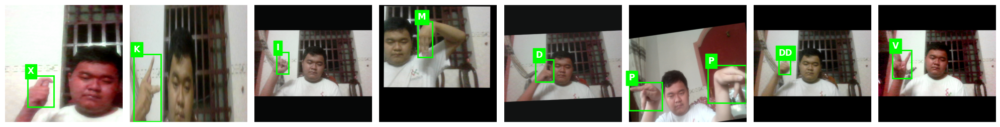

In [ ]:
visualize_augmented_data(train_dataset, num_samples=8)

In [ ]:
# Initialize model, optimizer, loss, and scheduler
print("Initializing model and training components...")

# Create model
model = DETR(num_classes=num_classes, hidden_dim=256, nheads=8,
             num_encoder_layers=1, num_decoder_layers=1, num_queries=25)
model = model.to(device)
print(f"Model moved to {device}")

# Loss weights
weights = {
    'class_weighting': 1.0,
    'bbox_weighting': 5.0,
    'giou_weighting': 2.0
}

# Create matcher and loss function
matcher = HungarianMatcher(weights)
criterion = DETRLoss(num_classes=num_classes, matcher=matcher,
                     weight_dict=weights, eos_coef=0.1)
criterion = criterion.to(device)
# Optimizer and scheduler
param_dicts = [
    {
        "params": [p for n, p in model.named_parameters() if "backbone" not in n and p.requires_grad],
        "lr": 1e-4
    },
    {
        "params": [p for n, p in model.named_parameters() if "backbone" in n and p.requires_grad],
        "lr": 1e-5
    },
]

optimizer = torch.optim.AdamW(
    param_dicts,
    weight_decay=1e-4
)

scheduler = optim.lr_scheduler.MultiStepLR(optimizer, milestones=[60, 80], gamma=0.1)
print("Model initialized successfully!")
print(f"Total parameters: {sum(p.numel() for p in model.parameters()):,}")
print(f"Trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")

Initializing model and training components...
Model moved to cuda
Model initialized successfully!
Total parameters: 26,942,044
Trainable parameters: 26,942,044


##Training

In [ ]:
output_dir = '/content/drive/MyDrive/NCKH_SignDETR_VSL/v2/resnet/base/output'
log_dir = '/content/drive/MyDrive/NCKH_SignDETR_VSL/v2/resnet/base/logs'

In [ ]:
import time
import copy
from tqdm import tqdm
import shutil
# Lưu backup sau mỗi epoch

def train_one_epoch(model, dataloader, criterion, optimizer, device, weights):
    model.train()
    total_loss_epoch = 0.0
    loss_ce_epoch = 0.0
    loss_bbox_epoch = 0.0
    loss_giou_epoch = 0.0

    # Dùng tqdm để tạo thanh tiến trình
    pbar = tqdm(dataloader, desc="Training", leave=False)
    for images, targets in pbar:
        # Chuyển dữ liệu lên GPU/CPU
        images = images.to(device)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # Forward pass
        outputs = model(images)
        loss_dict = criterion(outputs, targets)

        # Lấy từng thành phần loss
        loss_ce = loss_dict['labels']['loss_ce']
        loss_bbox = loss_dict['boxes']['loss_bbox']
        loss_giou = loss_dict['boxes']['loss_giou']

        loss = (weights['class_weighting'] * loss_ce +
                weights['bbox_weighting'] * loss_bbox +
                weights['giou_weighting'] * loss_giou)

        # Backward pass và tối ưu hóa
        optimizer.zero_grad()
        loss.backward()

        # Gradient clipping: Giúp DETR hội tụ ổn định hơn
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=0.1)
        optimizer.step()

        # Cộng dồn loss để tính trung bình
        total_loss_epoch += loss.item()
        loss_ce_epoch += loss_ce.item()
        loss_bbox_epoch += loss_bbox.item()
        loss_giou_epoch += loss_giou.item()

        pbar.set_postfix({'Loss': f"{loss.item():.4f}"})

    n = len(dataloader)
    return {
        'total_loss': total_loss_epoch / n,
        'loss_ce': loss_ce_epoch / n,
        'loss_bbox': loss_bbox_epoch / n,
        'loss_giou': loss_giou_epoch / n
    }

@torch.no_grad()
def evaluate(model, dataloader, criterion, device, weights):
    model.eval()
    total_loss_epoch = 0.0
    loss_ce_epoch = 0.0
    loss_bbox_epoch = 0.0
    loss_giou_epoch = 0.0

    pbar = tqdm(dataloader, desc="Evaluating", leave=False)
    for images, targets in pbar:
        images = images.to(device)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        outputs = model(images)
        loss_dict = criterion(outputs, targets)

        loss_ce = loss_dict['labels']['loss_ce']
        loss_bbox = loss_dict['boxes']['loss_bbox']
        loss_giou = loss_dict['boxes']['loss_giou']

        loss = (weights['class_weighting'] * loss_ce +
                weights['bbox_weighting'] * loss_bbox +
                weights['giou_weighting'] * loss_giou)

        total_loss_epoch += loss.item()
        loss_ce_epoch += loss_ce.item()
        loss_bbox_epoch += loss_bbox.item()
        loss_giou_epoch += loss_giou.item()

    n = len(dataloader)
    return {
        'total_loss': total_loss_epoch / n,
        'loss_ce': loss_ce_epoch / n,
        'loss_bbox': loss_bbox_epoch / n,
        'loss_giou': loss_giou_epoch / n
    }

In [ ]:
import os
import time
import json
import torch

drive_dir = '/content/drive/MyDrive/NCKH_SignDETR_VSL/v2/resnet/base/output/'
os.makedirs(drive_dir, exist_ok=True)

# Khai báo các file cần lưu
best_model_path = os.path.join(drive_dir, 'best_signdetr_model.pth')
history_path = os.path.join(drive_dir, 'training_history.json')
log_path = os.path.join(drive_dir, 'training_log.txt')

# Cài đặt tần suất lưu thêm epoch (Ví dụ: 5 epoch lưu 1 lần)
save_freq = 5

# 2. Cấu trúc lưu lịch sử training
history = {
    'train_loss': [], 'val_loss': [],
    'train_ce': [], 'val_ce': [],
    'train_bbox': [], 'val_bbox': [],
    'train_giou': [], 'val_giou': [],
    'lr': []
}

best_val_loss = float('inf')

def log_and_print(text, log_file):
    print(text)
    with open(log_file, 'a', encoding='utf-8') as f:
        f.write(text + '\n')

log_and_print(f"Bắt đầu training {num_epochs} epochs...", log_path)

for epoch in range(num_epochs):
    start_time = time.time()

    # Train 1 epoch
    train_metrics = train_one_epoch(model, train_dataloader, criterion, optimizer, device, weights)

    # Evaluate trên tập validation
    val_metrics = evaluate(model, valid_dataloader, criterion, device, weights)

    # Cập nhật learning rate scheduler
    scheduler.step()
    current_lr = optimizer.param_groups[0]['lr']

    # Ghi nhận lịch sử
    history['train_loss'].append(train_metrics['total_loss'])
    history['val_loss'].append(val_metrics['total_loss'])
    history['train_ce'].append(train_metrics['loss_ce'])
    history['val_ce'].append(val_metrics['loss_ce'])
    history['train_bbox'].append(train_metrics['loss_bbox'])
    history['val_bbox'].append(val_metrics['loss_bbox'])
    history['train_giou'].append(train_metrics['loss_giou'])
    history['val_giou'].append(val_metrics['loss_giou'])
    history['lr'].append(current_lr)

    # LƯU HISTORY THÀNH FILE JSON
    with open(history_path, 'w', encoding='utf-8') as f:
        json.dump(history, f, indent=4)

    saved_msg = ""

    # LƯU MODEL TỐT NHẤT (BEST MODEL)
    if val_metrics['total_loss'] < best_val_loss:
        best_val_loss = val_metrics['total_loss']
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': best_val_loss,
        }, best_model_path)
        saved_msg += " [Best Model]"

    # LƯU THÊM CÁC EPOCH ĐỊNH KỲ HOẶC EPOCH CUỐI CÙNG (CHECKPOINT)
    if (epoch + 1) % save_freq == 0 or (epoch + 1) == num_epochs:
        checkpoint_path = os.path.join(drive_dir, f'checkpoint_epoch_{epoch+1:03d}.pth')
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': val_metrics['total_loss'],
        }, checkpoint_path)
        saved_msg += f" [Saved Checkpoint Ep {epoch+1}]"

    epoch_time = time.time() - start_time

    # GHI LOG CHO EPOCH HIỆN TẠI
    log_str1 = f"Epoch {epoch+1:03d}/{num_epochs} | Thời gian: {epoch_time:.0f}s | LR: {current_lr:.2e}"
    log_str2 = f"  Train Loss: {train_metrics['total_loss']:.4f} (CE:{train_metrics['loss_ce']:.4f}, BBox:{train_metrics['loss_bbox']:.4f}, GIoU:{train_metrics['loss_giou']:.4f})"
    log_str3 = f"  Val Loss:   {val_metrics['total_loss']:.4f} (CE:{val_metrics['loss_ce']:.4f}, BBox:{val_metrics['loss_bbox']:.4f}, GIoU:{val_metrics['loss_giou']:.4f}){saved_msg}\n"

    log_and_print(log_str1, log_path)
    log_and_print(log_str2, log_path)
    log_and_print(log_str3, log_path)

log_and_print("Training hoàn tất!", log_path)

Bắt đầu training 100 epochs...


Epoch 001/100 | Thời gian: 187s | LR: 1.00e-04
  Train Loss: 4.2420 (CE:1.8220, BBox:0.2215, GIoU:0.6561)
  Val Loss:   4.1596 (CE:1.7787, BBox:0.1583, GIoU:0.7947) [Best Model]



Epoch 002/100 | Thời gian: 186s | LR: 1.00e-04
  Train Loss: 3.7226 (CE:1.7767, BBox:0.1703, GIoU:0.5471)
  Val Loss:   3.2496 (CE:1.7515, BBox:0.0980, GIoU:0.5040) [Best Model]



Epoch 003/100 | Thời gian: 182s | LR: 1.00e-04
  Train Loss: 3.4386 (CE:1.7597, BBox:0.1403, GIoU:0.4885)
  Val Loss:   3.1286 (CE:1.7537, BBox:0.0876, GIoU:0.4684) [Best Model]



Epoch 004/100 | Thời gian: 182s | LR: 1.00e-04
  Train Loss: 3.3461 (CE:1.7412, BBox:0.1341, GIoU:0.4673)
  Val Loss:   3.1185 (CE:1.7024, BBox:0.1011, GIoU:0.4552) [Best Model]



Epoch 005/100 | Thời gian: 182s | LR: 1.00e-04
  Train Loss: 3.1934 (CE:1.6955, BBox:0.1240, GIoU:0.4390)
  Val Loss:   2.9691 (CE:1.6322, BBox:0.0797, GIoU:0.4693) [Best Model] [Saved Checkpoint Ep 5]



Epoch 006/100 | Thời gian: 184s | LR: 1.00e-04
  Train Loss: 3.1129 (CE:1.6256, BBox:0.1215, GIoU:0.4400)
  Val Loss:   2.8815 (CE:1.5666, BBox:0.0763, GIoU:0.4668) [Best Model]



Epoch 007/100 | Thời gian: 181s | LR: 1.00e-04
  Train Loss: 3.0264 (CE:1.5481, BBox:0.1205, GIoU:0.4379)
  Val Loss:   2.8194 (CE:1.3854, BBox:0.0805, GIoU:0.5158) [Best Model]



Epoch 008/100 | Thời gian: 181s | LR: 1.00e-04
  Train Loss: 2.9037 (CE:1.4683, BBox:0.1147, GIoU:0.4310)
  Val Loss:   2.6062 (CE:1.4171, BBox:0.0703, GIoU:0.4188) [Best Model]



Epoch 009/100 | Thời gian: 181s | LR: 1.00e-04
  Train Loss: 2.7940 (CE:1.3910, BBox:0.1133, GIoU:0.4182)
  Val Loss:   2.4833 (CE:1.3320, BBox:0.0643, GIoU:0.4150) [Best Model]



Epoch 010/100 | Thời gian: 185s | LR: 1.00e-04
  Train Loss: 2.6829 (CE:1.3260, BBox:0.1088, GIoU:0.4064)
  Val Loss:   2.4681 (CE:1.2478, BBox:0.0686, GIoU:0.4386) [Best Model] [Saved Checkpoint Ep 10]



Epoch 011/100 | Thời gian: 186s | LR: 1.00e-04
  Train Loss: 2.5623 (CE:1.2398, BBox:0.1053, GIoU:0.3981)
  Val Loss:   2.2423 (CE:1.2012, BBox:0.0609, GIoU:0.3682) [Best Model]



Epoch 012/100 | Thời gian: 179s | LR: 1.00e-04
  Train Loss: 2.4725 (CE:1.1861, BBox:0.1015, GIoU:0.3895)
  Val Loss:   2.3102 (CE:1.1529, BBox:0.0763, GIoU:0.3879)



Epoch 013/100 | Thời gian: 176s | LR: 1.00e-04
  Train Loss: 2.3931 (CE:1.1201, BBox:0.1029, GIoU:0.3793)
  Val Loss:   2.0383 (CE:1.0522, BBox:0.0571, GIoU:0.3503) [Best Model]



Epoch 014/100 | Thời gian: 180s | LR: 1.00e-04
  Train Loss: 2.3497 (CE:1.0682, BBox:0.1016, GIoU:0.3869)
  Val Loss:   2.0674 (CE:1.0265, BBox:0.0611, GIoU:0.3677)



Epoch 015/100 | Thời gian: 176s | LR: 1.00e-04
  Train Loss: 2.3026 (CE:1.0055, BBox:0.1024, GIoU:0.3926)
  Val Loss:   2.0653 (CE:0.8788, BBox:0.0654, GIoU:0.4296) [Saved Checkpoint Ep 15]



Epoch 016/100 | Thời gian: 181s | LR: 1.00e-04
  Train Loss: 2.2239 (CE:0.9553, BBox:0.0999, GIoU:0.3845)
  Val Loss:   1.9255 (CE:0.8653, BBox:0.0665, GIoU:0.3639) [Best Model]



Epoch 017/100 | Thời gian: 180s | LR: 1.00e-04
  Train Loss: 2.0945 (CE:0.8894, BBox:0.0951, GIoU:0.3647)
  Val Loss:   1.9941 (CE:0.8426, BBox:0.0622, GIoU:0.4203)



Epoch 018/100 | Thời gian: 177s | LR: 1.00e-04
  Train Loss: 2.0585 (CE:0.8513, BBox:0.0954, GIoU:0.3651)
  Val Loss:   1.7534 (CE:0.7659, BBox:0.0542, GIoU:0.3583) [Best Model]



Epoch 019/100 | Thời gian: 179s | LR: 1.00e-04
  Train Loss: 1.9692 (CE:0.8068, BBox:0.0919, GIoU:0.3514)
  Val Loss:   1.8417 (CE:0.7543, BBox:0.0677, GIoU:0.3744)



Epoch 020/100 | Thời gian: 179s | LR: 1.00e-04
  Train Loss: 1.8605 (CE:0.7403, BBox:0.0879, GIoU:0.3404)
  Val Loss:   1.6678 (CE:0.6741, BBox:0.0574, GIoU:0.3533) [Best Model] [Saved Checkpoint Ep 20]



Epoch 021/100 | Thời gian: 185s | LR: 1.00e-04
  Train Loss: 1.7839 (CE:0.7230, BBox:0.0824, GIoU:0.3244)
  Val Loss:   1.6887 (CE:0.6740, BBox:0.0551, GIoU:0.3695)



Epoch 022/100 | Thời gian: 175s | LR: 1.00e-04
  Train Loss: 1.7468 (CE:0.6924, BBox:0.0838, GIoU:0.3176)
  Val Loss:   1.8145 (CE:0.6998, BBox:0.0626, GIoU:0.4009)



Epoch 023/100 | Thời gian: 177s | LR: 1.00e-04
  Train Loss: 1.7077 (CE:0.6549, BBox:0.0819, GIoU:0.3216)
  Val Loss:   1.5135 (CE:0.6195, BBox:0.0495, GIoU:0.3233) [Best Model]



Epoch 024/100 | Thời gian: 179s | LR: 1.00e-04
  Train Loss: 1.6365 (CE:0.6347, BBox:0.0788, GIoU:0.3039)
  Val Loss:   1.6218 (CE:0.7061, BBox:0.0504, GIoU:0.3318)



Epoch 025/100 | Thời gian: 178s | LR: 1.00e-04
  Train Loss: 1.6025 (CE:0.6408, BBox:0.0749, GIoU:0.2937)
  Val Loss:   1.3502 (CE:0.6103, BBox:0.0421, GIoU:0.2646) [Best Model] [Saved Checkpoint Ep 25]



Epoch 026/100 | Thời gian: 187s | LR: 1.00e-04
  Train Loss: 1.5522 (CE:0.6135, BBox:0.0734, GIoU:0.2858)
  Val Loss:   1.3461 (CE:0.6070, BBox:0.0425, GIoU:0.2634) [Best Model]



Epoch 027/100 | Thời gian: 182s | LR: 1.00e-04
  Train Loss: 1.5216 (CE:0.5993, BBox:0.0724, GIoU:0.2800)
  Val Loss:   1.5800 (CE:0.5954, BBox:0.0560, GIoU:0.3522)



Epoch 028/100 | Thời gian: 178s | LR: 1.00e-04
  Train Loss: 1.5097 (CE:0.6027, BBox:0.0708, GIoU:0.2766)
  Val Loss:   1.3290 (CE:0.6336, BBox:0.0411, GIoU:0.2449) [Best Model]



Epoch 029/100 | Thời gian: 187s | LR: 1.00e-04
  Train Loss: 1.4699 (CE:0.5694, BBox:0.0702, GIoU:0.2748)
  Val Loss:   1.2188 (CE:0.5722, BBox:0.0374, GIoU:0.2297) [Best Model]



Epoch 030/100 | Thời gian: 181s | LR: 1.00e-04
  Train Loss: 1.4047 (CE:0.5440, BBox:0.0669, GIoU:0.2631)
  Val Loss:   1.4445 (CE:0.6165, BBox:0.0474, GIoU:0.2954) [Saved Checkpoint Ep 30]



Epoch 031/100 | Thời gian: 180s | LR: 1.00e-04
  Train Loss: 1.4101 (CE:0.5283, BBox:0.0690, GIoU:0.2685)
  Val Loss:   1.4235 (CE:0.5278, BBox:0.0476, GIoU:0.3289)



Epoch 032/100 | Thời gian: 176s | LR: 1.00e-04
  Train Loss: 1.4119 (CE:0.5398, BBox:0.0678, GIoU:0.2667)
  Val Loss:   1.2288 (CE:0.5232, BBox:0.0397, GIoU:0.2536)



Epoch 033/100 | Thời gian: 175s | LR: 1.00e-04
  Train Loss: 1.3962 (CE:0.5249, BBox:0.0672, GIoU:0.2677)
  Val Loss:   1.2527 (CE:0.5384, BBox:0.0411, GIoU:0.2544)



Epoch 034/100 | Thời gian: 178s | LR: 1.00e-04
  Train Loss: 1.3456 (CE:0.5178, BBox:0.0643, GIoU:0.2532)
  Val Loss:   1.1742 (CE:0.5261, BBox:0.0366, GIoU:0.2325) [Best Model]



Epoch 035/100 | Thời gian: 183s | LR: 1.00e-04
  Train Loss: 1.3637 (CE:0.5149, BBox:0.0668, GIoU:0.2574)
  Val Loss:   1.1667 (CE:0.5095, BBox:0.0375, GIoU:0.2349) [Best Model] [Saved Checkpoint Ep 35]



Epoch 036/100 | Thời gian: 185s | LR: 1.00e-04
  Train Loss: 1.3151 (CE:0.4957, BBox:0.0636, GIoU:0.2508)
  Val Loss:   1.1946 (CE:0.4818, BBox:0.0419, GIoU:0.2518)



Epoch 037/100 | Thời gian: 176s | LR: 1.00e-04
  Train Loss: 1.2848 (CE:0.4851, BBox:0.0621, GIoU:0.2445)
  Val Loss:   1.3804 (CE:0.5893, BBox:0.0460, GIoU:0.2806)



Epoch 038/100 | Thời gian: 176s | LR: 1.00e-04
  Train Loss: 1.2760 (CE:0.4721, BBox:0.0621, GIoU:0.2466)
  Val Loss:   1.1756 (CE:0.4734, BBox:0.0411, GIoU:0.2484)



Epoch 039/100 | Thời gian: 177s | LR: 1.00e-04
  Train Loss: 1.2538 (CE:0.4508, BBox:0.0628, GIoU:0.2444)
  Val Loss:   1.0671 (CE:0.4287, BBox:0.0373, GIoU:0.2260) [Best Model]



Epoch 040/100 | Thời gian: 182s | LR: 1.00e-04
  Train Loss: 1.2407 (CE:0.4537, BBox:0.0600, GIoU:0.2436)
  Val Loss:   1.2430 (CE:0.4638, BBox:0.0410, GIoU:0.2871) [Saved Checkpoint Ep 40]



Epoch 041/100 | Thời gian: 181s | LR: 1.00e-04
  Train Loss: 1.2289 (CE:0.4237, BBox:0.0628, GIoU:0.2456)
  Val Loss:   1.0891 (CE:0.4207, BBox:0.0368, GIoU:0.2422)



Epoch 042/100 | Thời gian: 176s | LR: 1.00e-04
  Train Loss: 1.2194 (CE:0.4142, BBox:0.0617, GIoU:0.2484)
  Val Loss:   1.1087 (CE:0.4129, BBox:0.0403, GIoU:0.2472)



Epoch 043/100 | Thời gian: 176s | LR: 1.00e-04
  Train Loss: 1.1934 (CE:0.3954, BBox:0.0615, GIoU:0.2454)
  Val Loss:   1.1533 (CE:0.4317, BBox:0.0383, GIoU:0.2650)



Epoch 044/100 | Thời gian: 175s | LR: 1.00e-04
  Train Loss: 1.1831 (CE:0.3904, BBox:0.0602, GIoU:0.2458)
  Val Loss:   1.1537 (CE:0.3920, BBox:0.0418, GIoU:0.2763)



Epoch 045/100 | Thời gian: 177s | LR: 1.00e-04
  Train Loss: 1.1351 (CE:0.3778, BBox:0.0584, GIoU:0.2326)
  Val Loss:   1.0863 (CE:0.3783, BBox:0.0394, GIoU:0.2554) [Saved Checkpoint Ep 45]



Epoch 046/100 | Thời gian: 181s | LR: 1.00e-04
  Train Loss: 1.1241 (CE:0.3451, BBox:0.0601, GIoU:0.2391)
  Val Loss:   0.9331 (CE:0.2865, BBox:0.0363, GIoU:0.2325) [Best Model]



Epoch 047/100 | Thời gian: 179s | LR: 1.00e-04
  Train Loss: 1.1168 (CE:0.3307, BBox:0.0601, GIoU:0.2428)
  Val Loss:   0.9517 (CE:0.3260, BBox:0.0344, GIoU:0.2269)



Epoch 048/100 | Thời gian: 177s | LR: 1.00e-04
  Train Loss: 1.0887 (CE:0.3406, BBox:0.0576, GIoU:0.2300)
  Val Loss:   0.8851 (CE:0.2689, BBox:0.0343, GIoU:0.2223) [Best Model]



Epoch 049/100 | Thời gian: 179s | LR: 1.00e-04
  Train Loss: 1.0752 (CE:0.3148, BBox:0.0576, GIoU:0.2361)
  Val Loss:   0.9677 (CE:0.2898, BBox:0.0377, GIoU:0.2448)



Epoch 050/100 | Thời gian: 177s | LR: 1.00e-04
  Train Loss: 1.0853 (CE:0.3311, BBox:0.0584, GIoU:0.2312)
  Val Loss:   0.9066 (CE:0.2436, BBox:0.0359, GIoU:0.2417) [Saved Checkpoint Ep 50]



Epoch 051/100 | Thời gian: 180s | LR: 1.00e-04
  Train Loss: 1.0459 (CE:0.3014, BBox:0.0564, GIoU:0.2313)
  Val Loss:   0.9072 (CE:0.2518, BBox:0.0353, GIoU:0.2396)



Epoch 052/100 | Thời gian: 175s | LR: 1.00e-04
  Train Loss: 1.0437 (CE:0.2908, BBox:0.0566, GIoU:0.2350)
  Val Loss:   0.9786 (CE:0.2457, BBox:0.0386, GIoU:0.2700)



Epoch 053/100 | Thời gian: 177s | LR: 1.00e-04
  Train Loss: 1.0322 (CE:0.2741, BBox:0.0573, GIoU:0.2357)
  Val Loss:   0.8588 (CE:0.2130, BBox:0.0358, GIoU:0.2333) [Best Model]



Epoch 054/100 | Thời gian: 179s | LR: 1.00e-04
  Train Loss: 1.0072 (CE:0.2633, BBox:0.0562, GIoU:0.2314)
  Val Loss:   0.9164 (CE:0.2360, BBox:0.0380, GIoU:0.2451)



Epoch 055/100 | Thời gian: 177s | LR: 1.00e-04
  Train Loss: 0.9717 (CE:0.2481, BBox:0.0546, GIoU:0.2254)
  Val Loss:   0.9085 (CE:0.1860, BBox:0.0380, GIoU:0.2662) [Saved Checkpoint Ep 55]



Epoch 056/100 | Thời gian: 181s | LR: 1.00e-04
  Train Loss: 0.9696 (CE:0.2516, BBox:0.0543, GIoU:0.2233)
  Val Loss:   0.8252 (CE:0.2081, BBox:0.0342, GIoU:0.2231) [Best Model]



Epoch 057/100 | Thời gian: 179s | LR: 1.00e-04
  Train Loss: 0.9690 (CE:0.2410, BBox:0.0550, GIoU:0.2266)
  Val Loss:   0.8730 (CE:0.2073, BBox:0.0367, GIoU:0.2411)



Epoch 058/100 | Thời gian: 176s | LR: 1.00e-04
  Train Loss: 0.9510 (CE:0.2415, BBox:0.0535, GIoU:0.2211)
  Val Loss:   1.0127 (CE:0.2211, BBox:0.0428, GIoU:0.2887)



Epoch 059/100 | Thời gian: 176s | LR: 1.00e-04
  Train Loss: 0.9365 (CE:0.2345, BBox:0.0528, GIoU:0.2190)
  Val Loss:   0.8444 (CE:0.2005, BBox:0.0334, GIoU:0.2384)



Epoch 060/100 | Thời gian: 177s | LR: 1.00e-05
  Train Loss: 0.9272 (CE:0.2203, BBox:0.0533, GIoU:0.2202)
  Val Loss:   0.9399 (CE:0.2035, BBox:0.0391, GIoU:0.2704) [Saved Checkpoint Ep 60]



Epoch 061/100 | Thời gian: 181s | LR: 1.00e-05
  Train Loss: 0.8000 (CE:0.2005, BBox:0.0452, GIoU:0.1868)
  Val Loss:   0.7118 (CE:0.1504, BBox:0.0283, GIoU:0.2101) [Best Model]



Epoch 062/100 | Thời gian: 181s | LR: 1.00e-05
  Train Loss: 0.7658 (CE:0.1919, BBox:0.0438, GIoU:0.1773)
  Val Loss:   0.6614 (CE:0.1517, BBox:0.0263, GIoU:0.1891) [Best Model]



Epoch 063/100 | Thời gian: 180s | LR: 1.00e-05
  Train Loss: 0.7558 (CE:0.1899, BBox:0.0423, GIoU:0.1772)
  Val Loss:   0.6664 (CE:0.1561, BBox:0.0264, GIoU:0.1893)



Epoch 064/100 | Thời gian: 176s | LR: 1.00e-05
  Train Loss: 0.7503 (CE:0.1880, BBox:0.0422, GIoU:0.1756)
  Val Loss:   0.6785 (CE:0.1523, BBox:0.0268, GIoU:0.1961)



Epoch 065/100 | Thời gian: 188s | LR: 1.00e-05
  Train Loss: 0.7457 (CE:0.1826, BBox:0.0426, GIoU:0.1751)
  Val Loss:   0.6483 (CE:0.1518, BBox:0.0256, GIoU:0.1843) [Best Model] [Saved Checkpoint Ep 65]



Epoch 066/100 | Thời gian: 189s | LR: 1.00e-05
  Train Loss: 0.7356 (CE:0.1840, BBox:0.0414, GIoU:0.1723)
  Val Loss:   0.6849 (CE:0.1595, BBox:0.0264, GIoU:0.1967)



Epoch 067/100 | Thời gian: 176s | LR: 1.00e-05
  Train Loss: 0.7400 (CE:0.1834, BBox:0.0423, GIoU:0.1726)
  Val Loss:   0.6546 (CE:0.1517, BBox:0.0257, GIoU:0.1871)



Epoch 068/100 | Thời gian: 175s | LR: 1.00e-05
  Train Loss: 0.7305 (CE:0.1763, BBox:0.0416, GIoU:0.1731)
  Val Loss:   0.6500 (CE:0.1451, BBox:0.0265, GIoU:0.1862)



Epoch 069/100 | Thời gian: 178s | LR: 1.00e-05
  Train Loss: 0.7240 (CE:0.1780, BBox:0.0408, GIoU:0.1711)
  Val Loss:   0.5755 (CE:0.1456, BBox:0.0235, GIoU:0.1563) [Best Model]



Epoch 070/100 | Thời gian: 182s | LR: 1.00e-05
  Train Loss: 0.7303 (CE:0.1787, BBox:0.0417, GIoU:0.1716)
  Val Loss:   0.6424 (CE:0.1441, BBox:0.0257, GIoU:0.1848) [Saved Checkpoint Ep 70]



Epoch 071/100 | Thời gian: 181s | LR: 1.00e-05
  Train Loss: 0.7262 (CE:0.1755, BBox:0.0421, GIoU:0.1701)
  Val Loss:   0.7111 (CE:0.1430, BBox:0.0280, GIoU:0.2141)



Epoch 072/100 | Thời gian: 176s | LR: 1.00e-05
  Train Loss: 0.7179 (CE:0.1688, BBox:0.0414, GIoU:0.1710)
  Val Loss:   0.6490 (CE:0.1428, BBox:0.0263, GIoU:0.1874)



Epoch 073/100 | Thời gian: 176s | LR: 1.00e-05
  Train Loss: 0.7195 (CE:0.1703, BBox:0.0415, GIoU:0.1709)
  Val Loss:   0.6675 (CE:0.1399, BBox:0.0273, GIoU:0.1957)



Epoch 074/100 | Thời gian: 176s | LR: 1.00e-05
  Train Loss: 0.7030 (CE:0.1660, BBox:0.0407, GIoU:0.1668)
  Val Loss:   0.6797 (CE:0.1396, BBox:0.0281, GIoU:0.1998)



Epoch 075/100 | Thời gian: 177s | LR: 1.00e-05
  Train Loss: 0.7047 (CE:0.1714, BBox:0.0402, GIoU:0.1662)
  Val Loss:   0.6365 (CE:0.1387, BBox:0.0253, GIoU:0.1855) [Saved Checkpoint Ep 75]



Epoch 076/100 | Thời gian: 180s | LR: 1.00e-05
  Train Loss: 0.7146 (CE:0.1762, BBox:0.0410, GIoU:0.1667)
  Val Loss:   0.6363 (CE:0.1431, BBox:0.0251, GIoU:0.1840)



Epoch 077/100 | Thời gian: 175s | LR: 1.00e-05
  Train Loss: 0.7092 (CE:0.1634, BBox:0.0411, GIoU:0.1701)
  Val Loss:   0.6702 (CE:0.1362, BBox:0.0279, GIoU:0.1972)



Epoch 078/100 | Thời gian: 176s | LR: 1.00e-05
  Train Loss: 0.7024 (CE:0.1539, BBox:0.0415, GIoU:0.1704)
  Val Loss:   0.6103 (CE:0.1133, BBox:0.0258, GIoU:0.1841)



Epoch 079/100 | Thời gian: 177s | LR: 1.00e-05
  Train Loss: 0.7011 (CE:0.1373, BBox:0.0424, GIoU:0.1758)
  Val Loss:   0.5751 (CE:0.0956, BBox:0.0251, GIoU:0.1770) [Best Model]



Epoch 080/100 | Thời gian: 182s | LR: 1.00e-06
  Train Loss: 0.7044 (CE:0.1263, BBox:0.0436, GIoU:0.1801)
  Val Loss:   0.5770 (CE:0.0869, BBox:0.0247, GIoU:0.1833) [Saved Checkpoint Ep 80]



Epoch 081/100 | Thời gian: 184s | LR: 1.00e-06
  Train Loss: 0.6881 (CE:0.1184, BBox:0.0426, GIoU:0.1784)
  Val Loss:   0.5773 (CE:0.0864, BBox:0.0253, GIoU:0.1822)



Epoch 082/100 | Thời gian: 178s | LR: 1.00e-06
  Train Loss: 0.6769 (CE:0.1184, BBox:0.0419, GIoU:0.1745)
  Val Loss:   0.5668 (CE:0.0866, BBox:0.0248, GIoU:0.1781) [Best Model]



Epoch 083/100 | Thời gian: 184s | LR: 1.00e-06
  Train Loss: 0.6793 (CE:0.1118, BBox:0.0424, GIoU:0.1778)
  Val Loss:   0.5660 (CE:0.0863, BBox:0.0248, GIoU:0.1780) [Best Model]



Epoch 084/100 | Thời gian: 180s | LR: 1.00e-06
  Train Loss: 0.6764 (CE:0.1150, BBox:0.0418, GIoU:0.1761)
  Val Loss:   0.5885 (CE:0.0858, BBox:0.0255, GIoU:0.1875)



Epoch 085/100 | Thời gian: 177s | LR: 1.00e-06
  Train Loss: 0.6748 (CE:0.1147, BBox:0.0420, GIoU:0.1749)
  Val Loss:   0.5671 (CE:0.0860, BBox:0.0250, GIoU:0.1781) [Saved Checkpoint Ep 85]



Epoch 086/100 | Thời gian: 182s | LR: 1.00e-06
  Train Loss: 0.6897 (CE:0.1253, BBox:0.0424, GIoU:0.1762)
  Val Loss:   0.5598 (CE:0.0859, BBox:0.0246, GIoU:0.1754) [Best Model]



Epoch 087/100 | Thời gian: 180s | LR: 1.00e-06
  Train Loss: 0.6788 (CE:0.1156, BBox:0.0420, GIoU:0.1767)
  Val Loss:   0.5814 (CE:0.0854, BBox:0.0252, GIoU:0.1849)



Epoch 088/100 | Thời gian: 176s | LR: 1.00e-06
  Train Loss: 0.6766 (CE:0.1144, BBox:0.0423, GIoU:0.1753)
  Val Loss:   0.5683 (CE:0.0851, BBox:0.0247, GIoU:0.1799)



Epoch 089/100 | Thời gian: 176s | LR: 1.00e-06
  Train Loss: 0.6787 (CE:0.1150, BBox:0.0421, GIoU:0.1767)
  Val Loss:   0.5879 (CE:0.0852, BBox:0.0255, GIoU:0.1877)



Epoch 090/100 | Thời gian: 180s | LR: 1.00e-06
  Train Loss: 0.6760 (CE:0.1151, BBox:0.0421, GIoU:0.1751)
  Val Loss:   0.5806 (CE:0.0852, BBox:0.0252, GIoU:0.1847) [Saved Checkpoint Ep 90]



Epoch 091/100 | Thời gian: 180s | LR: 1.00e-06
  Train Loss: 0.6835 (CE:0.1172, BBox:0.0422, GIoU:0.1775)
  Val Loss:   0.5662 (CE:0.0853, BBox:0.0247, GIoU:0.1787)



Epoch 092/100 | Thời gian: 177s | LR: 1.00e-06
  Train Loss: 0.6703 (CE:0.1110, BBox:0.0421, GIoU:0.1744)
  Val Loss:   0.5546 (CE:0.0862, BBox:0.0245, GIoU:0.1729) [Best Model]



Epoch 093/100 | Thời gian: 180s | LR: 1.00e-06
  Train Loss: 0.6732 (CE:0.1170, BBox:0.0409, GIoU:0.1758)
  Val Loss:   0.5568 (CE:0.0853, BBox:0.0244, GIoU:0.1748)



Epoch 094/100 | Thời gian: 176s | LR: 1.00e-06
  Train Loss: 0.6899 (CE:0.1138, BBox:0.0434, GIoU:0.1797)
  Val Loss:   0.5571 (CE:0.0848, BBox:0.0245, GIoU:0.1750)



Epoch 095/100 | Thời gian: 178s | LR: 1.00e-06
  Train Loss: 0.6803 (CE:0.1185, BBox:0.0419, GIoU:0.1761)
  Val Loss:   0.5428 (CE:0.0845, BBox:0.0238, GIoU:0.1696) [Best Model] [Saved Checkpoint Ep 95]



Epoch 096/100 | Thời gian: 185s | LR: 1.00e-06
  Train Loss: 0.6686 (CE:0.1126, BBox:0.0421, GIoU:0.1728)
  Val Loss:   0.5540 (CE:0.0853, BBox:0.0242, GIoU:0.1739)



Epoch 097/100 | Thời gian: 176s | LR: 1.00e-06
  Train Loss: 0.6803 (CE:0.1139, BBox:0.0420, GIoU:0.1781)
  Val Loss:   0.5660 (CE:0.0854, BBox:0.0247, GIoU:0.1785)



Epoch 098/100 | Thời gian: 176s | LR: 1.00e-06
  Train Loss: 0.6708 (CE:0.1153, BBox:0.0412, GIoU:0.1748)
  Val Loss:   0.5791 (CE:0.0833, BBox:0.0252, GIoU:0.1850)



Epoch 099/100 | Thời gian: 175s | LR: 1.00e-06
  Train Loss: 0.6715 (CE:0.1088, BBox:0.0426, GIoU:0.1749)
  Val Loss:   0.5801 (CE:0.0855, BBox:0.0254, GIoU:0.1839)



Epoch 100/100 | Thời gian: 177s | LR: 1.00e-06
  Train Loss: 0.6710 (CE:0.1075, BBox:0.0424, GIoU:0.1758)
  Val Loss:   0.5545 (CE:0.0836, BBox:0.0241, GIoU:0.1751) [Saved Checkpoint Ep 100]

Training hoàn tất!


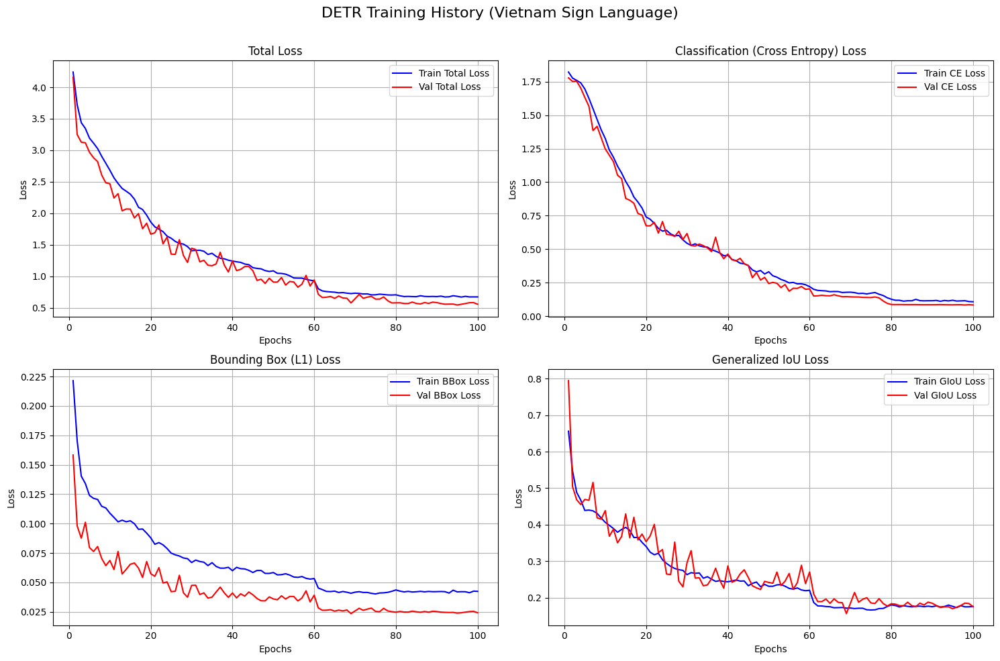

In [ ]:
import matplotlib.pyplot as plt

def plot_training_history(history):
    epochs = range(1, len(history['train_loss']) + 1)

    fig, axs = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle('DETR Training History (Vietnam Sign Language)', fontsize=16)

    # 1. Total Loss
    axs[0, 0].plot(epochs, history['train_loss'], 'b-', label='Train Total Loss')
    axs[0, 0].plot(epochs, history['val_loss'], 'r-', label='Val Total Loss')
    axs[0, 0].set_title('Total Loss')
    axs[0, 0].set_xlabel('Epochs')
    axs[0, 0].set_ylabel('Loss')
    axs[0, 0].legend()
    axs[0, 0].grid(True)

    # 2. Classification Loss
    axs[0, 1].plot(epochs, history['train_ce'], 'b-', label='Train CE Loss')
    axs[0, 1].plot(epochs, history['val_ce'], 'r-', label='Val CE Loss')
    axs[0, 1].set_title('Classification (Cross Entropy) Loss')
    axs[0, 1].set_xlabel('Epochs')
    axs[0, 1].set_ylabel('Loss')
    axs[0, 1].legend()
    axs[0, 1].grid(True)

    # 3. Bounding Box L1 Loss
    axs[1, 0].plot(epochs, history['train_bbox'], 'b-', label='Train BBox Loss')
    axs[1, 0].plot(epochs, history['val_bbox'], 'r-', label='Val BBox Loss')
    axs[1, 0].set_title('Bounding Box (L1) Loss')
    axs[1, 0].set_xlabel('Epochs')
    axs[1, 0].set_ylabel('Loss')
    axs[1, 0].legend()
    axs[1, 0].grid(True)

    # 4. GIoU Loss
    axs[1, 1].plot(epochs, history['train_giou'], 'b-', label='Train GIoU Loss')
    axs[1, 1].plot(epochs, history['val_giou'], 'r-', label='Val GIoU Loss')
    axs[1, 1].set_title('Generalized IoU Loss')
    axs[1, 1].set_xlabel('Epochs')
    axs[1, 1].set_ylabel('Loss')
    axs[1, 1].legend()
    axs[1, 1].grid(True)

    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

# Gọi hàm để vẽ biểu đồ
plot_training_history(history)

In [ ]:
test_dataloader = DataLoader(
    test_dataset,
    batch_size=8,
    collate_fn=stacker,
    drop_last=False
)

In [ ]:
import torch
import torch.nn.functional as F
from tqdm import tqdm

@torch.no_grad()
def calculate_accuracy_and_deviation(model, dataloader, matcher, device):
    model.eval()

    total_matched_objects = 0
    correct_class_predictions = 0
    total_box_deviation = 0.0

    # Biến để lưu sai số riêng cho từng thành phần (Tùy chọn xem chi tiết)
    dev_cx, dev_cy, dev_w, dev_h = 0.0, 0.0, 0.0, 0.0

    pbar = tqdm(dataloader, desc="Calculating Accuracy & Deviation")
    for images, targets in pbar:
        images = images.to(device)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # 1. Chạy model để lấy dự đoán
        outputs = model(images)

        # 2. Dùng HungarianMatcher để tìm ra các dự đoán khớp với Ground Truth nhất
        indices = matcher(outputs, targets)

        for batch_idx, (pred_idx, tgt_idx) in enumerate(indices):
            # Lấy ra các dự đoán và đáp án đã được ghép cặp (matched)
            pred_logits_matched = outputs['pred_logits'][batch_idx, pred_idx]
            pred_boxes_matched = outputs['pred_boxes'][batch_idx, pred_idx]

            tgt_labels_matched = targets[batch_idx]['labels'][tgt_idx]
            tgt_boxes_matched = targets[batch_idx]['boxes'][tgt_idx]

            num_objects = len(tgt_labels_matched)
            if num_objects == 0:
                continue

            total_matched_objects += num_objects

            # --- TÍNH ACCURACY (Phân loại chữ cái) ---
            # Lấy class có xác suất cao nhất (bỏ qua class nền ở index cuối)
            pred_labels = pred_logits_matched.argmax(dim=-1)
            correct_class_predictions += (pred_labels == tgt_labels_matched).sum().item()

            # --- TÍNH ĐỘ LỆCH (Box Deviation - L1 Error) ---
            # Tính sai số tuyệt đối trung bình cho 4 tọa độ (cx, cy, w, h)
            # Tọa độ đang ở dạng chuẩn hóa (0 -> 1)
            deviation = F.l1_loss(pred_boxes_matched, tgt_boxes_matched, reduction='sum').item()
            total_box_deviation += deviation

            # Tính sai số chi tiết cho tâm (cx, cy) và kích thước (w, h)
            abs_diff = torch.abs(pred_boxes_matched - tgt_boxes_matched)
            dev_cx += abs_diff[:, 0].sum().item()
            dev_cy += abs_diff[:, 1].sum().item()
            dev_w  += abs_diff[:, 2].sum().item()
            dev_h  += abs_diff[:, 3].sum().item()

    # Tổng hợp kết quả
    if total_matched_objects == 0:
        print("Không tìm thấy đối tượng nào trong tập test!")
        return

    accuracy = (correct_class_predictions / total_matched_objects) * 100

    # Chia cho (số object * 4 tọa độ) để ra độ lệch trung bình trên mỗi trục tọa độ
    avg_deviation = total_box_deviation / (total_matched_objects * 4)

    avg_dev_cx = dev_cx / total_matched_objects
    avg_dev_cy = dev_cy / total_matched_objects
    avg_dev_w  = dev_w / total_matched_objects
    avg_dev_h  = dev_h / total_matched_objects

    print("\n" + "="*50)
    print(" KẾT QUẢ ACCURACY & ĐỘ LỆCH TRÊN TẬP TEST ".center(50))
    print("="*50)
    print(f"Tổng số đối tượng được test : {total_matched_objects}")
    print(f"Độ chính xác nhãn (Accuracy): {accuracy:.2f}% ({correct_class_predictions}/{total_matched_objects} đúng)")
    print("-" * 50)
    print(f"Độ lệch tổng thể (Trung bình): {avg_deviation:.4f} (theo tỷ lệ ảnh 0-1)")
    print("Chi tiết độ lệch từng thông số:")
    print(f"  - Lệch tọa độ X (cx)       : {avg_dev_cx:.4f} (~{avg_dev_cx*100:.2f}% chiều rộng ảnh)")
    print(f"  - Lệch tọa độ Y (cy)       : {avg_dev_cy:.4f} (~{avg_dev_cy*100:.2f}% chiều cao ảnh)")
    print(f"  - Lệch chiều rộng (w)      : {avg_dev_w:.4f}  (~{avg_dev_w*100:.2f}% chiều rộng ảnh)")
    print(f"  - Lệch chiều cao (h)       : {avg_dev_h:.4f}  (~{avg_dev_h*100:.2f}% chiều cao ảnh)")
    print("="*50)

# Gọi hàm để tính toán
calculate_accuracy_and_deviation(model, test_dataloader, matcher, device)

Calculating Accuracy & Deviation: 100%|██████████| 69/69 [00:25<00:00,  2.69it/s]


     KẾT QUẢ ACCURACY & ĐỘ LỆCH TRÊN TẬP TEST     
Tổng số đối tượng được test : 730
Độ chính xác nhãn (Accuracy): 99.86% (729/730 đúng)
--------------------------------------------------
Độ lệch tổng thể (Trung bình): 0.0064 (theo tỷ lệ ảnh 0-1)
Chi tiết độ lệch từng thông số:
  - Lệch tọa độ X (cx)       : 0.0082 (~0.82% chiều rộng ảnh)
  - Lệch tọa độ Y (cy)       : 0.0033 (~0.33% chiều cao ảnh)
  - Lệch chiều rộng (w)      : 0.0075  (~0.75% chiều rộng ảnh)
  - Lệch chiều cao (h)       : 0.0066  (~0.66% chiều cao ảnh)


In [ ]:
import torch
import torch.nn.functional as F
from tqdm import tqdm

@torch.no_grad()
def calculate_advanced_metrics(model, dataloader, matcher, device, id2name):
    model.eval()

    total_matched_objects = 0
    correct_class_predictions = 0
    total_box_deviation = 0.0
    total_iou = 0.0

    # Dictionary để theo dõi số lượng và độ chính xác của từng chữ cái
    class_totals = {i: 0 for i in id2name.keys()}
    class_corrects = {i: 0 for i in id2name.keys()}

    pbar = tqdm(dataloader, desc="Calculating Advanced Metrics")
    for images, targets in pbar:
        images = images.to(device)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        outputs = model(images)
        indices = matcher(outputs, targets)

        for batch_idx, (pred_idx, tgt_idx) in enumerate(indices):
            pred_logits_matched = outputs['pred_logits'][batch_idx, pred_idx]
            pred_boxes_matched = outputs['pred_boxes'][batch_idx, pred_idx]

            tgt_labels_matched = targets[batch_idx]['labels'][tgt_idx]
            tgt_boxes_matched = targets[batch_idx]['boxes'][tgt_idx]

            num_objects = len(tgt_labels_matched)
            if num_objects == 0:
                continue

            total_matched_objects += num_objects

            # --- 1. TÍNH ACCURACY & PER-CLASS ACCURACY ---
            pred_labels = pred_logits_matched.argmax(dim=-1)
            correct_mask = (pred_labels == tgt_labels_matched)
            correct_class_predictions += correct_mask.sum().item()

            # Thống kê chi tiết cho từng chữ cái
            for p_label, t_label, is_correct in zip(pred_labels, tgt_labels_matched, correct_mask):
                t_id = t_label.item()
                if t_id in class_totals:
                    class_totals[t_id] += 1
                    if is_correct.item():
                        class_corrects[t_id] += 1

            # --- 2. TÍNH ĐỘ LỆCH (L1 Deviation) ---
            deviation = F.l1_loss(pred_boxes_matched, tgt_boxes_matched, reduction='sum').item()
            total_box_deviation += deviation

            # --- 3. TÍNH mIoU (mean Intersection over Union) ---
            # Chuyển đổi về dạng [x1, y1, x2, y2] để tính IoU
            pred_xyxy = box_cxcywh_to_xyxy(pred_boxes_matched)
            tgt_xyxy = box_cxcywh_to_xyxy(tgt_boxes_matched)

            # Hàm box_iou trả về ma trận NxN, ta lấy đường chéo (diag) vì các box đã được match 1-1
            iou_matrix, _ = box_iou(pred_xyxy, tgt_xyxy)
            matched_iou = torch.diag(iou_matrix)
            total_iou += matched_iou.sum().item()

    # ================= HIỂN THỊ KẾT QUẢ =================
    if total_matched_objects == 0:
        print("Không tìm thấy đối tượng nào trong tập test!")
        return

    accuracy = (correct_class_predictions / total_matched_objects) * 100
    avg_deviation = total_box_deviation / (total_matched_objects * 4)
    mIoU = (total_iou / total_matched_objects) * 100

    print("\n" + "="*50)
    print(" BÁO CÁO ĐÁNH GIÁ MÔ HÌNH NHẬN DIỆN VSL ".center(50))
    print("="*50)
    print(f"Tổng số bàn tay được test: {total_matched_objects}")
    print(f"1. Độ chính xác tổng thể : {accuracy:.2f}%")
    print(f"2. Độ lệch tọa độ (L1)   : {avg_deviation:.4f}")
    print(f"3. Chỉ số mIoU (Độ khớp) : {mIoU:.2f}% (Càng gần 100% khung hình càng ôm sát tay)")
    print("-" * 50)

    print("4. CHI TIẾT ĐỘ CHÍNH XÁC TỪNG CHỮ CÁI (Nhận diện điểm mù):")
    # Sắp xếp các class theo độ chính xác từ thấp đến cao để dễ tìm lỗi
    class_accuracies = []
    for cls_id, total in class_totals.items():
        if total > 0:
            acc = (class_corrects[cls_id] / total) * 100
            class_accuracies.append((id2name[cls_id], acc, class_corrects[cls_id], total))

    class_accuracies.sort(key=lambda x: x[1]) # Sắp xếp tăng dần theo accuracy

    for name, acc, correct, total in class_accuracies:
        # Highlight những chữ cái nhận diện kém (< 70%)
        warning = " ⚠️ Cần thêm data" if acc < 70 else ""
        print(f"   - Chữ {name:<3} : {acc:6.2f}% ({correct}/{total}){warning}")
    print("="*50)

# Gọi hàm (nhớ truyền biến id2name vào)
# calculate_advanced_metrics(model, test_dataloader, matcher, device, id2name)

In [ ]:
calculate_advanced_metrics(model, test_dataloader, matcher, device, id2name)

Calculating Advanced Metrics: 100%|██████████| 69/69 [00:21<00:00,  3.22it/s]


      BÁO CÁO ĐÁNH GIÁ MÔ HÌNH NHẬN DIỆN VSL      
Tổng số bàn tay được test: 730
1. Độ chính xác tổng thể : 99.86%
2. Độ lệch tọa độ (L1)   : 0.0064
3. Chỉ số mIoU (Độ khớp) : 82.18% (Càng gần 100% khung hình càng ôm sát tay)
--------------------------------------------------
4. CHI TIẾT ĐỘ CHÍNH XÁC TỪNG CHỮ CÁI (Nhận diện điểm mù):
   - Chữ I   :  97.14% (34/35)
   - Chữ A   : 100.00% (28/28)
   - Chữ B   : 100.00% (31/31)
   - Chữ C   : 100.00% (34/34)
   - Chữ D   : 100.00% (34/34)
   - Chữ DD  : 100.00% (26/26)
   - Chữ E   : 100.00% (34/34)
   - Chữ G   : 100.00% (31/31)
   - Chữ H   : 100.00% (33/33)
   - Chữ K   : 100.00% (32/32)
   - Chữ L   : 100.00% (35/35)
   - Chữ M   : 100.00% (29/29)
   - Chữ N   : 100.00% (26/26)
   - Chữ O   : 100.00% (33/33)
   - Chữ P   : 100.00% (29/29)
   - Chữ Q   : 100.00% (32/32)
   - Chữ R   : 100.00% (34/34)
   - Chữ S   : 100.00% (34/34)
   - Chữ T   : 100.00% (35/35)
   - Chữ U   : 100.00% (35/35)
   - Chữ V   : 100.00% (28/28)
   - Chữ X 

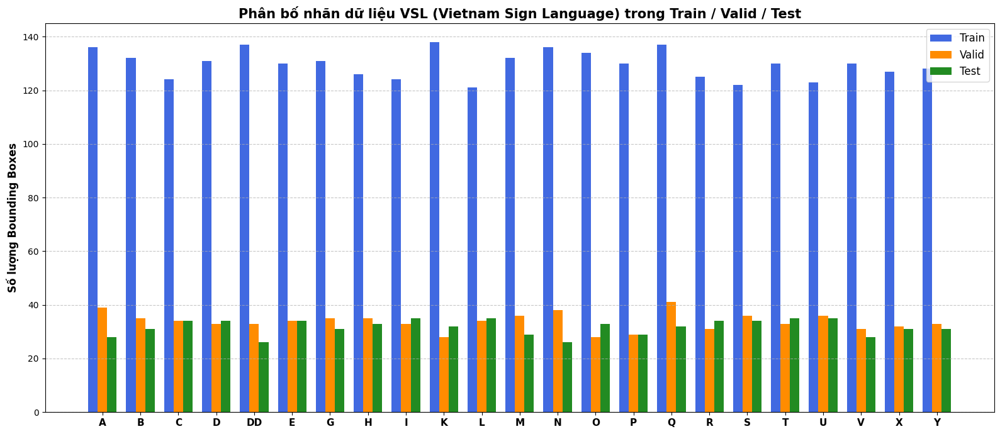


 Dataset sạch sẽ, không có ID nhãn nào vượt quá giới hạn 0-22.


In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np

DATA_DIR = "/content/SignDETR-VSL/"
splits = ['train', 'valid', 'test']
CLASSES = ['A', 'B', 'C', 'D', 'DD', 'E', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'X', 'Y']

# Khởi tạo dictionary để đếm số lượng bbox
counts = {split: {i: 0 for i in range(len(CLASSES))} for split in splits}
invalid_labels = []

# Quét file labels
for split in splits:
    lbl_dir = os.path.join(DATA_DIR, split, 'labels')
    if not os.path.exists(lbl_dir):
        continue

    for file in os.listdir(lbl_dir):
        if file.endswith('.txt'):
            with open(os.path.join(lbl_dir, file), 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) > 0:
                        cls_id = int(parts[0])
                        # Nếu ID nằm trong danh sách chuẩn
                        if 0 <= cls_id < len(CLASSES):
                            counts[split][cls_id] += 1
                        else:
                            invalid_labels.append((split, file, cls_id))

# Vẽ biểu đồ
x = np.arange(len(CLASSES))
width = 0.25  # Độ rộng của mỗi cột

fig, ax = plt.subplots(figsize=(16, 7))

train_counts = [counts['train'][i] for i in range(len(CLASSES))]
valid_counts = [counts['valid'][i] for i in range(len(CLASSES))]
test_counts = [counts['test'][i] for i in range(len(CLASSES))]

# Tạo các cột
rects1 = ax.bar(x - width, train_counts, width, label='Train', color='royalblue')
rects2 = ax.bar(x, valid_counts, width, label='Valid', color='darkorange')
rects3 = ax.bar(x + width, test_counts, width, label='Test', color='forestgreen')

# Trang trí biểu đồ
ax.set_ylabel('Số lượng Bounding Boxes', fontsize=12, fontweight='bold')
ax.set_title('Phân bố nhãn dữ liệu VSL (Vietnam Sign Language) trong Train / Valid / Test', fontsize=15, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(CLASSES, fontsize=11, fontweight='bold')
ax.legend(fontsize=12)
ax.grid(axis='y', linestyle='--', alpha=0.7)

plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# In cảnh báo nếu có nhãn rác
if invalid_labels:
    print("\n⚠️ CẢNH BÁO: Phát hiện các nhãn rác (ID >= 23 hoặc < 0) trong Dataset!")
    print(f"Tổng số nhãn rác: {len(invalid_labels)}")
    print("5 ví dụ đầu tiên:", invalid_labels[:5])
else:
    print("\n Dataset sạch sẽ, không có ID nhãn nào vượt quá giới hạn 0-22.")

In [ ]:
import os
import signal

# Đặt dòng này ở cuối cùng của notebook
print("Ngắt tiến trình...")
os.kill(os.getpid(), signal.SIGKILL)